## Downloading an Image

In [ ]:
!wget -O image.jpg https://w0.peakpx.com/wallpaper/171/706/HD-wallpaper-flowers-rose-flower-flowers-rose-flower-rose.jpg

##  Loading an Image 

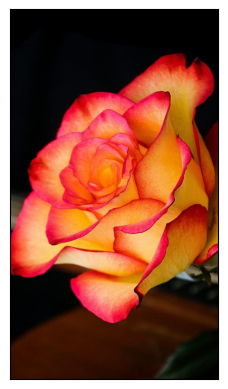

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('image.jpg')

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


plt.imshow(img)
#plt.tick_params(left = False, right = False , labelleft = False ,
#                labelbottom = False, bottom = False)

plt.axis("off")

# Image Denoising

In [458]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

!wget -O vegetable.jpg https://health.clevelandclinic.org/wp-content/uploads/sites/3/2016/02/cruciferousVegetables-157439382-770x533-1-745x490.jpg

img = cv2.imread('vegetable.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

noisy = np.zeros(img.shape, np.uint8)

--2023-05-03 03:21:00--  https://health.clevelandclinic.org/wp-content/uploads/sites/3/2016/02/cruciferousVegetables-157439382-770x533-1-745x490.jpg
Resolving health.clevelandclinic.org (health.clevelandclinic.org)... 104.18.32.95, 172.64.155.161
Connecting to health.clevelandclinic.org (health.clevelandclinic.org)|104.18.32.95|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 114167 (111K) [image/jpeg]
Saving to: 'vegetable.jpg'

     0K .......... .......... .......... .......... .......... 44%  377K 0s
    50K .......... .......... .......... .......... .......... 89% 60.3M 0s
   100K .......... .                                          100% 1.76M=0.1s

2023-05-03 03:21:00 (798 KB/s) - 'vegetable.jpg' saved [114167/114167]



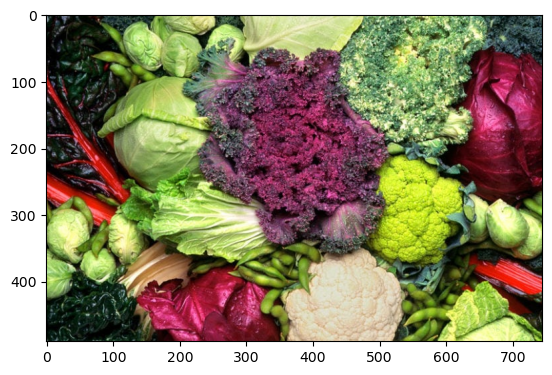

In [462]:
plt.imshow(img)

In [465]:
p = 0.2

#traversing throughout the image pixels
for i in range(img.shape[0]): #rows
    for j in range(img.shape[1]): #cols
        r = random.random()
        if r < p / 2:
            noisy[i][j] = [0, 0, 0] #black noise
        elif r < p:
            noisy[i][j] = [255, 255, 255] #white noise
        else:
            noisy[i][j] = img[i][j] #original image pixel

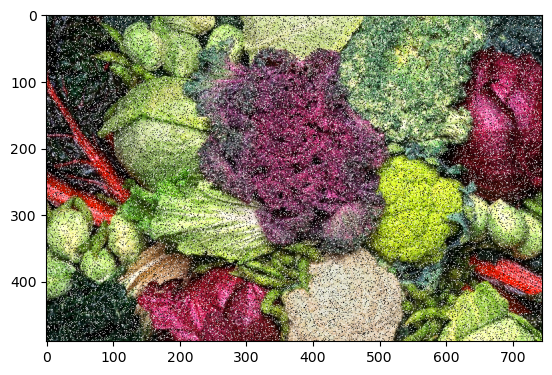

In [466]:
plt.imshow(noisy)

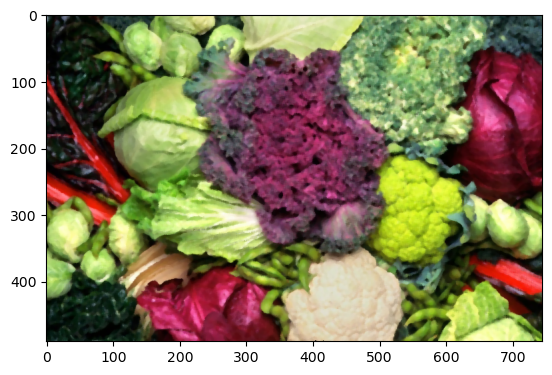

In [468]:
# median blur
denoised = cv2.medianBlur(noisy, 5)
plt.imshow(denoised)

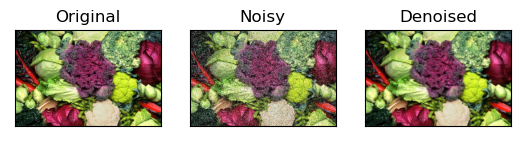

In [461]:
output = [img, noisy, denoised]

titles = ['Original', 'Noisy', 'Denoised']

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(output[i])
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

## Shading Correction

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pywt
import cv2
from skimage import (
    data, restoration, util
)

image = cv2.imread("shading_corr.jpg", 0)



In [4]:
image.shape

(418, 315)

In [18]:
background = restoration.rolling_ball(image, radius = 55)

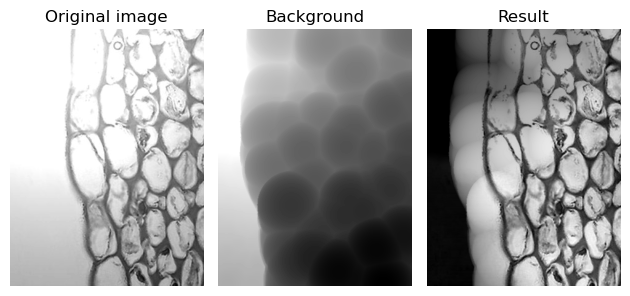

In [19]:
fig, ax = plt.subplots(nrows=1, ncols=3)

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original image')
ax[0].axis('off')

ax[1].imshow(background, cmap='gray')
ax[1].set_title('Background')
ax[1].axis('off')

ax[2].imshow(image - background, cmap='gray')
ax[2].set_title('Result')
ax[2].axis('off')

fig.tight_layout()

plt.show()






# Normalizing an image 

In [37]:
np.max(img)

255

In [38]:
np.min(img)

0

In [39]:
img = cv2.normalize(np.float32(img), None, 0, 1, cv2.NORM_MINMAX)


In [40]:
np.max(img)

1.0

In [44]:
np.min(img)

0.0

In [43]:
#img

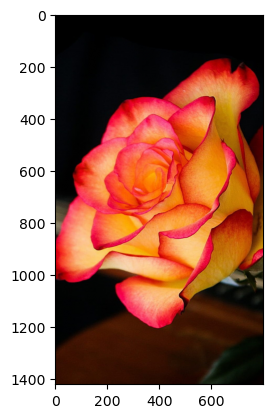

In [42]:
plt.imshow(img)

## Blurring using Box Filter (Convolution in Python)

In [56]:
kernel = np.array(np.ones(50)/9)

filtered_image = cv2.filter2D(img, -1, kernel)

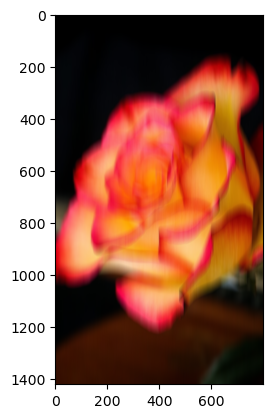

In [57]:
plt.imshow(cv2.normalize(filtered_image, None, 0, 1, cv2.NORM_MINMAX))

## Blurring using Gaussian Filter

In [46]:
def gaussian_filter(kernel_size, sigma=1, muu=0):

    # Initializing value of x,y as grid of kernel size
    # in the range of kernel size
 
    x, y = np.meshgrid(np.linspace(-1, 1, kernel_size),
                       np.linspace(-1, 1, kernel_size))
    dst = np.sqrt(x**2+y**2)
 
    # lower normal part of gaussian
    normal = 1/(np.sqrt(2* np.pi * sigma**2))
 
    # Calculating Gaussian filter
    gauss = np.exp(-((dst-muu)**2 / (2.0 * sigma**2))) * normal
    
    return gauss

In [47]:
kernel = gaussian_filter(15, 10, 1)

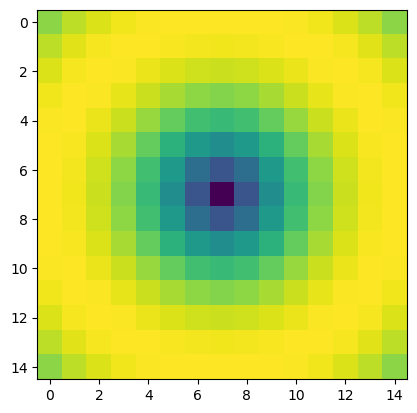

In [49]:
plt.imshow(kernel)

In [102]:
filtered_image_gaussian = cv2.filter2D(img,-1,kernel)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


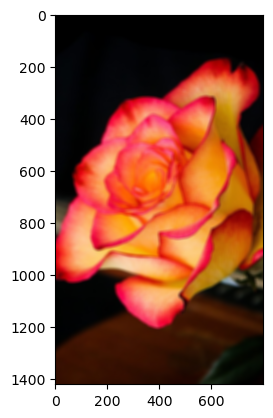

In [104]:
plt.imshow(cv2.normalize(filtered_image_gaussian, None, 0, 1, cv2.NORM_MINMAX))

# Spatial Background Filter

In [108]:
# Downloading the dog image 

!wget -O pet.jpg https://st2.depositphotos.com/4568481/49458/i/600/depositphotos_494582752-stock-photo-happy-active-purebred-welsh-corgi.jpg

--2023-05-01 10:47:25--  https://st2.depositphotos.com/4568481/49458/i/600/depositphotos_494582752-stock-photo-happy-active-purebred-welsh-corgi.jpg
Resolving st2.depositphotos.com (st2.depositphotos.com)... 23.58.101.193
Connecting to st2.depositphotos.com (st2.depositphotos.com)|23.58.101.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40758 (40K) [image/jpeg]
Saving to: 'pet.jpg'

     0K .......... .......... .......... .........            100%  270K=0.1s

2023-05-01 10:47:25 (270 KB/s) - 'pet.jpg' saved [40758/40758]



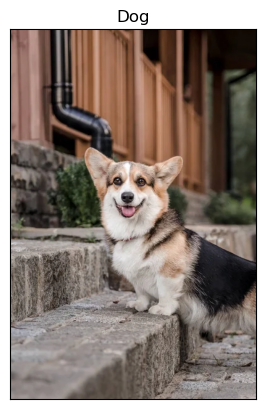

In [50]:
import matplotlib.pyplot as plt
pet = plt.imread('pet.jpg')

plt.imshow(pet)
plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
plt.title('Dog')
plt.show()

In [53]:
import cv2
import numpy as np
pet = plt.imread('pet.jpg')

blur = cv2.GaussianBlur(pet, (25, 25), 0)
bokeh = np.zeros_like(pet)
mask = np.zeros_like(pet)
height, width = pet.shape[:2]
center = (int(width/2), int(height/2))
radius = int(min(height, width)/4)
mask = cv2.circle(mask, center, radius, (255,255,255), -1)
binary_mask = mask/255
binary_mask_comp = 1-(mask/255)
for i in range(3):
    bokeh[:, :, i] = (np.multiply(pet[:, :, i], binary_mask[:, :, i]))+(np.multiply(blur[:, :, i],binary_mask_comp[:, :, i]))
    


    

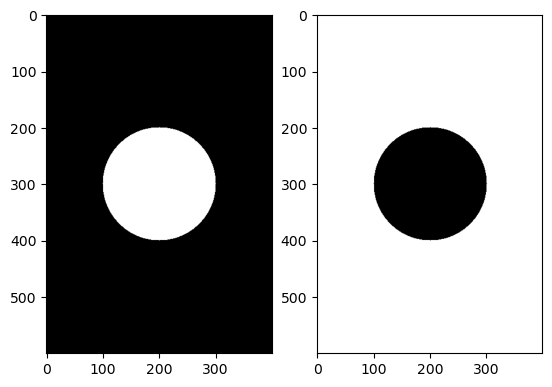

In [59]:
plt.subplot(1, 2, 1)
plt.imshow(binary_mask)

plt.subplot(1, 2, 2)
plt.imshow(binary_mask_comp)

plt.show()

(-0.5, 399.5, 599.5, -0.5)

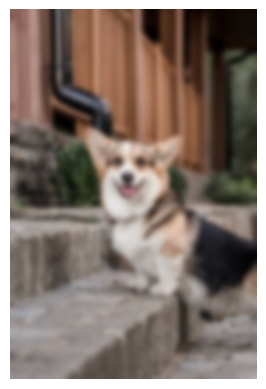

In [63]:
plt.imshow(blur)
plt.axis('off')

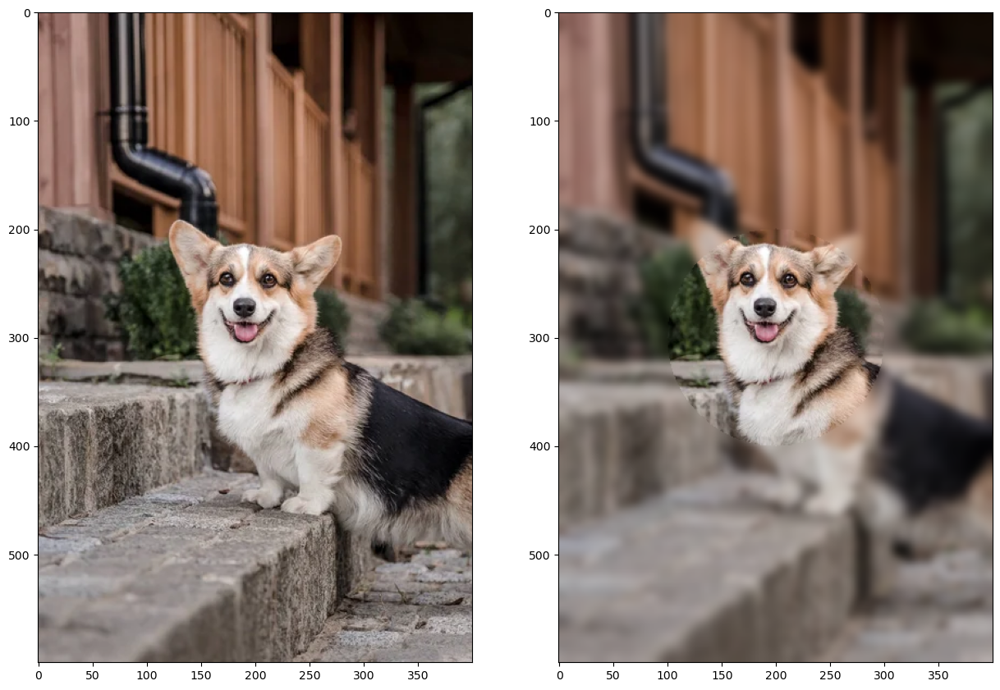

In [65]:
figure = plt.figure(figsize=(15, 15))
figure.add_subplot(1, 2, 1)
plt.imshow(pet)
figure.add_subplot(1, 2, 2)
plt.imshow(bokeh)


## We need smooth feathering mask



In [66]:

centerx = 0.0
centery = -0.0
aspectratio = (np.shape(pet)[1])/(np.shape(pet)[0])
x = (np.linspace(-0.5, 0.5, np.shape(pet)[1])-centerx)*aspectratio
y = (np.linspace(-0.5, 0.5, np.shape(pet)[0])-centery)

xx, yy = np.meshgrid(x, y)

In [67]:
sigma = 0.1
zz = np.power(xx**2+yy**2, sigma)

In [68]:
zznorm = np.max(zz)-zz

In [69]:
zznorm = np.divide(zznorm-np.min(zznorm), np.max(zznorm)+np.min(zznorm))

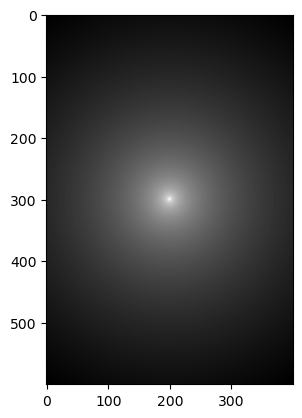

In [70]:
plt.imshow(zznorm, cmap='gray')

In [71]:
zznorm_clipped = np.clip(zznorm, 0.2, 0.4)
zznorm_clipped = (zznorm_clipped-np.min(zznorm_clipped))/(np.max(zznorm_clipped)-np.min(zznorm_clipped))

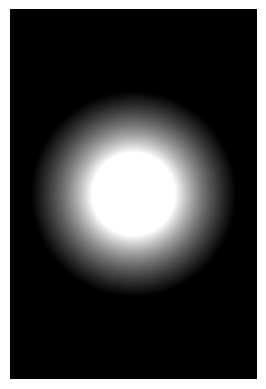

In [78]:
plt.imshow(zznorm_clipped, cmap='gray')
plt.axis('off')
plt.show()

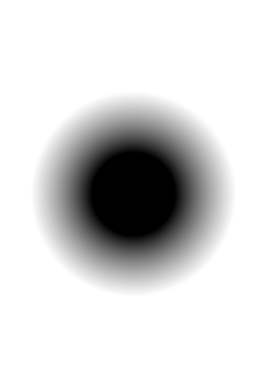

In [79]:
plt.imshow(1-zznorm_clipped, cmap='gray')
plt.axis('off')
plt.show()

In [73]:
np.min(zznorm_clipped)

0.0

In [74]:
nchannels =3
bokehmod = np.zeros_like(pet)
petf = np.float64(pet)/np.max(pet)
bokehmodf = (np.float64(bokehmod))/np.max(bokehmod)
blurf = (np.float64(blur))/np.max(blur)
for k in range(nchannels):
    bokehmodf[:, :, k] = (petf[:, :, k])*zznorm_clipped+(blurf[:, :, k])*(1-zznorm_clipped)

C:\Users\vinay\AppData\Local\Temp\ipykernel_54304\2107543654.py:4: RuntimeWarning: invalid value encountered in divide
  bokehmodf = (np.float64(bokehmod))/np.max(bokehmod)


(-0.5, 399.5, 599.5, -0.5)

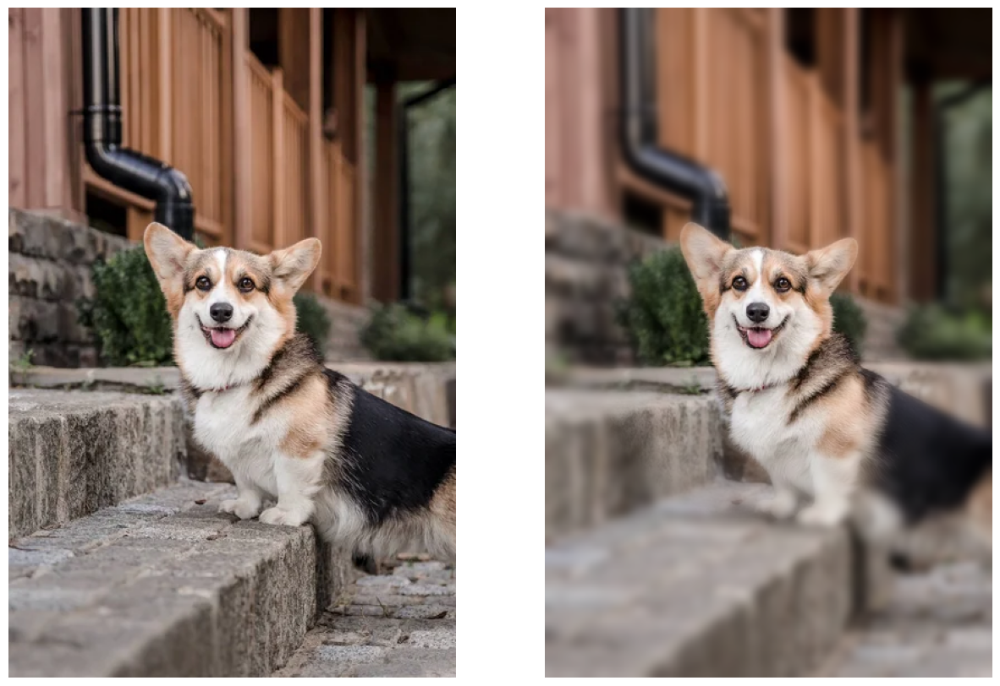

In [76]:
figure = plt.figure(figsize=(15, 15))
figure.add_subplot(1, 2, 1)
plt.imshow(pet)
plt.axis('off')
figure.add_subplot(1, 2, 2)
plt.imshow(bokehmodf)
plt.axis('off')

## Filtering in Frequency Domain

## Fourier based filtering

In [ ]:
https://dome.mit.edu/bitstream/handle/1721.3/195767/cameraman.tif

In [34]:
!wget -O cameraman.tif https://dome.mit.edu/bitstream/handle/1721.3/195767/cameraman.tif

--2023-05-02 08:38:31--  https://dome.mit.edu/bitstream/handle/1721.3/195767/cameraman.tif
Resolving dome.mit.edu (dome.mit.edu)... 184.73.82.185
Connecting to dome.mit.edu (dome.mit.edu)|184.73.82.185|:443... connected.
HTTP request sent, awaiting response... 200 OK
Syntax error in Set-Cookie: HttpOnly;Secure at position 9.
Length: 65240 (64K) [image/tiff]
Saving to: 'cameraman.tif'

     0K .......... .......... .......... .......... .......... 78%  105K 0s
    50K .......... ...                                        100% 63.2M=0.5s

2023-05-02 08:38:33 (133 KB/s) - 'cameraman.tif' saved [65240/65240]



In [80]:
import matplotlib.pyplot as plt

img_read = plt.imread("cameraman.tif")


(-0.5, 255.5, 255.5, -0.5)

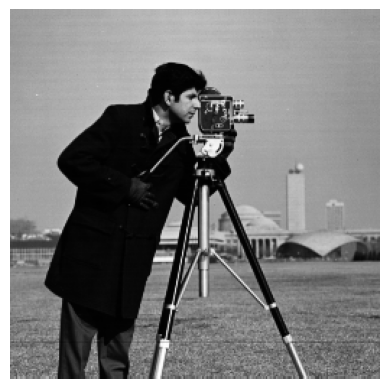

In [82]:
plt.imshow(img_read, cmap='gray')
plt.axis('off')

In [86]:
dft = cv2.dft(np.float32(img_read), flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 0])+1)



(-0.5, 255.5, 255.5, -0.5)

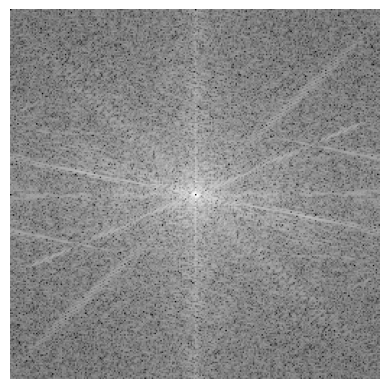

In [87]:
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis('off')

In [88]:
## High Pass frequency Mask

rows, cols = img_read.shape
crow, ccol = int(rows / 2), int(cols / 2)

maskhp = np.ones((rows, cols, 2), np.uint8)
r = 20
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
maskhp[mask_area] = 0


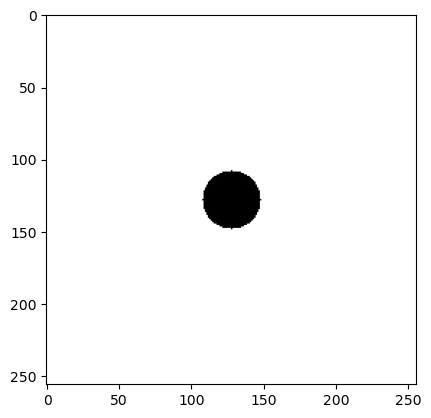

In [89]:
plt.imshow(maskhp[:, :, 1], cmap="gray")

In [90]:
# Circular LPF mask, center circle is 1, remaining all zeros
# Only allows low frequency components - smooth regions
#Can smooth out noise but blurs edges.
rows, cols = img_read.shape
crow, ccol = int(rows / 2), int(cols / 2)
masklp = np.zeros((rows, cols, 2), np.uint8)
r = 20
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
#x, y = np.meshgrid(np.ranrows,cols)
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
masklp[mask_area] = 1


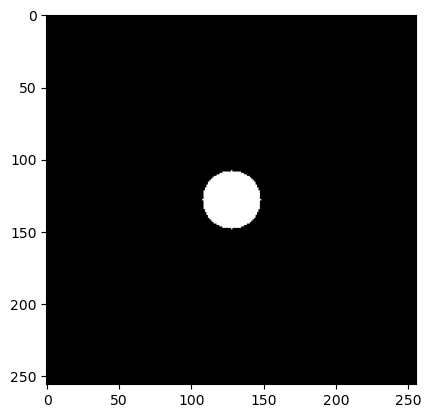

In [91]:
plt.imshow(masklp[:, :, 1], cmap="gray")

In [92]:
# Band Pass Filter - Concentric circle mask, only the points living in concentric circle are ones
rows, cols = img_read.shape
crow, ccol = int(rows / 2), int(cols / 2)
maskbp = np.zeros((rows, cols, 2), np.uint8)
r_out = 15
r_in = 5
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = np.logical_and(((x - center[0]) ** 2 + (y - center[1]) ** 2 >= r_in ** 2),
                           ((x - center[0]) ** 2 + (y - center[1]) ** 2 <= r_out ** 2))
maskbp[mask_area] = 1


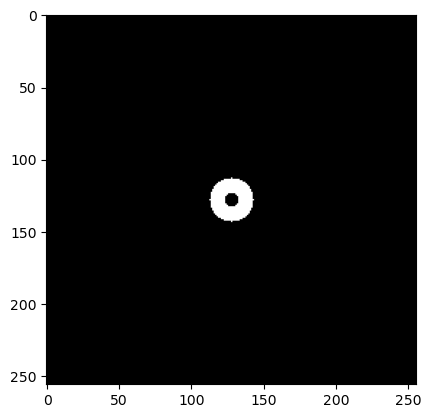

In [93]:
plt.imshow(maskbp[:, :, 1], cmap="gray")

C:\Users\vinay\AppData\Local\Temp\ipykernel_54304\1582174757.py:3: RuntimeWarning: divide by zero encountered in log
  fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))


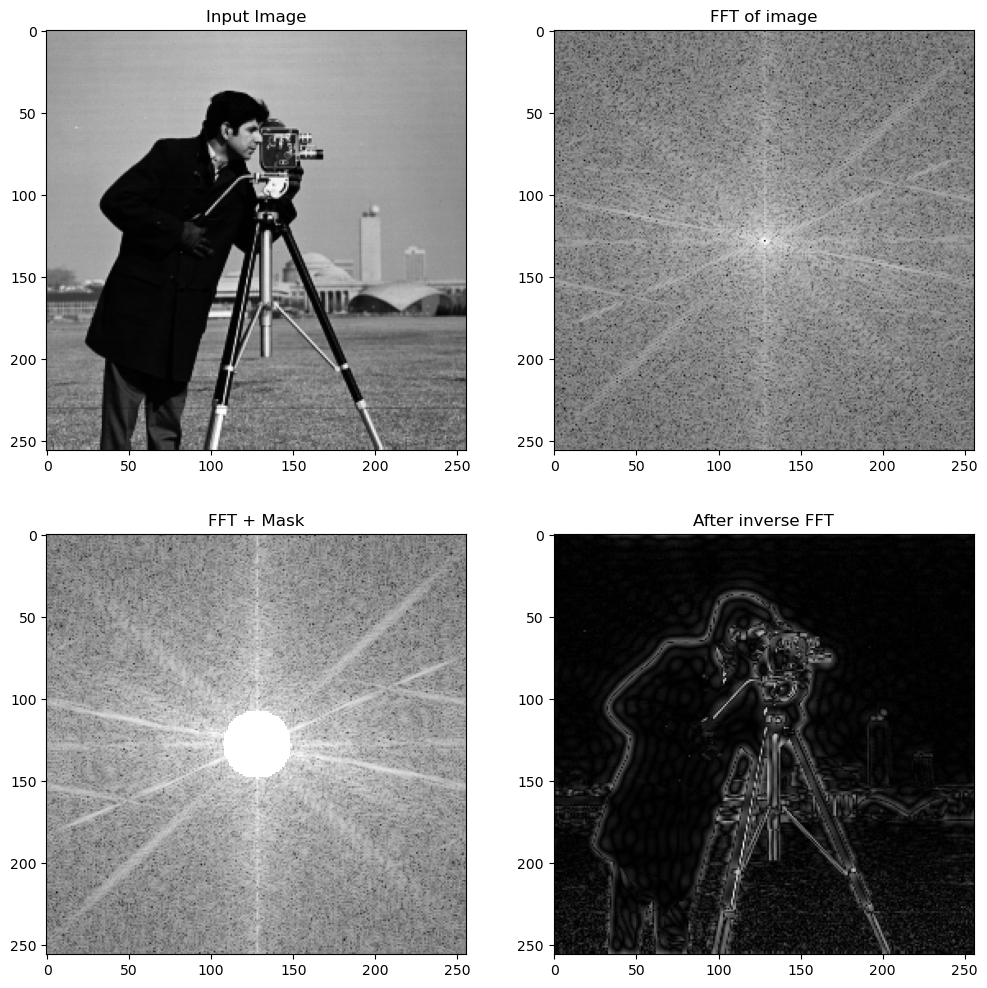

In [94]:
fshift = dft_shift * maskhp

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])



fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img_read, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.title.set_text('FFT of image')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fshift_mask_mag, cmap='gray')
ax3.title.set_text('FFT + Mask')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_back, cmap='gray')
ax4.title.set_text('After inverse FFT')
plt.show()

C:\Users\vinay\AppData\Local\Temp\ipykernel_54304\2953910986.py:3: RuntimeWarning: divide by zero encountered in log
  fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))


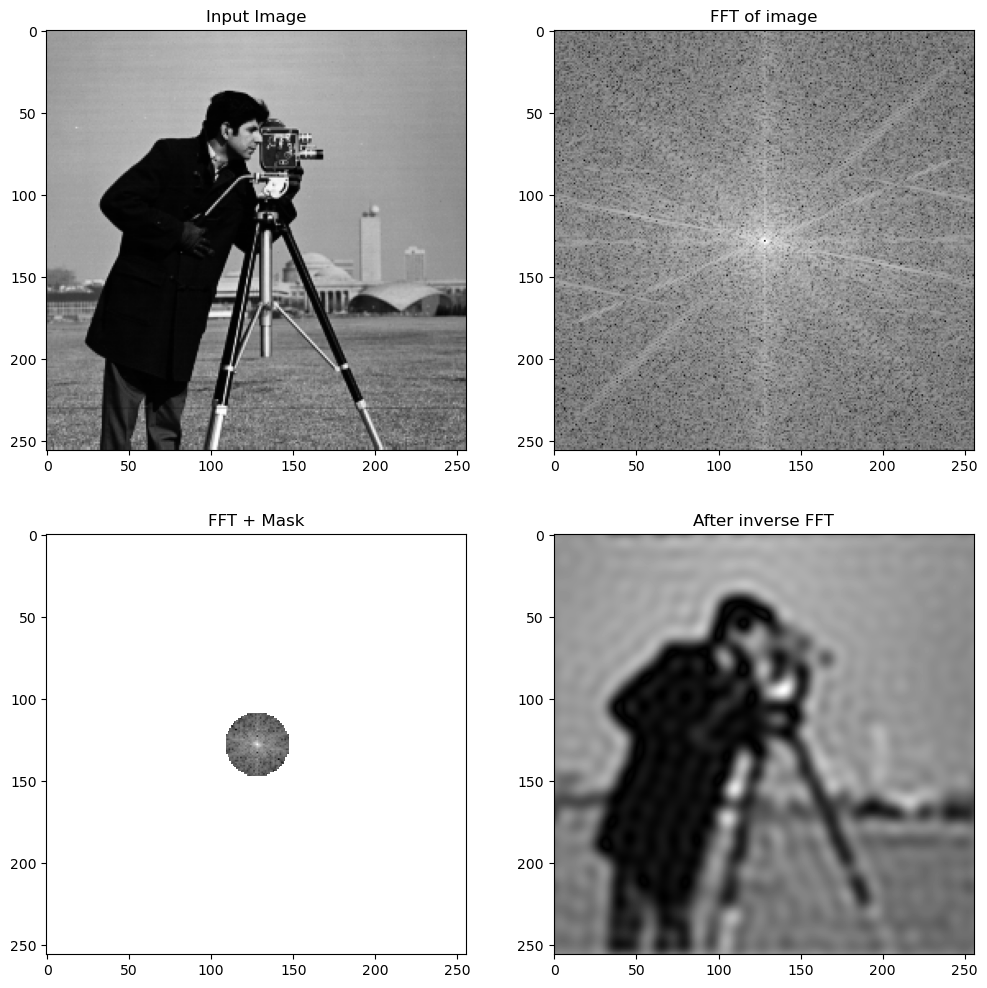

In [95]:
fshift = dft_shift * masklp

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])



fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img_read, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.title.set_text('FFT of image')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fshift_mask_mag, cmap='gray')
ax3.title.set_text('FFT + Mask')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_back, cmap='gray')
ax4.title.set_text('After inverse FFT')
plt.show()

C:\Users\vinay\AppData\Local\Temp\ipykernel_83376\772530705.py:3: RuntimeWarning: divide by zero encountered in log
  fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))


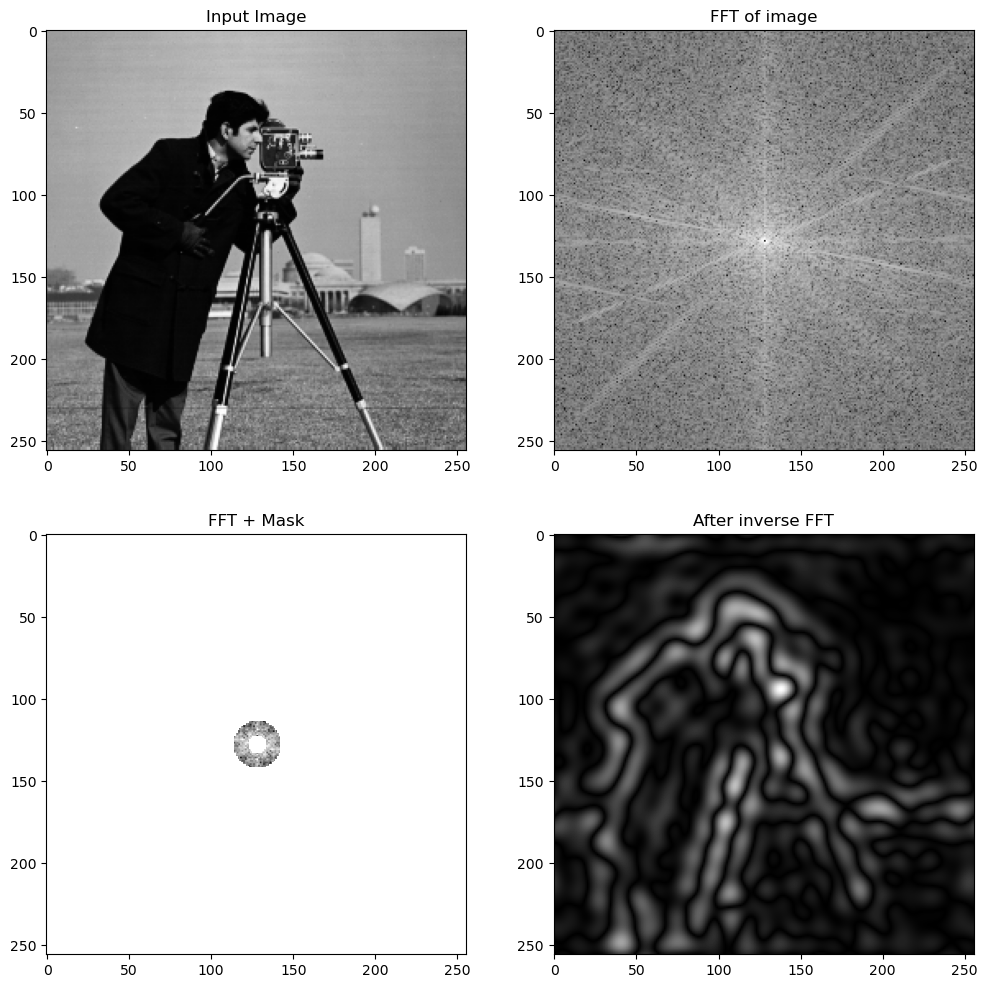

In [81]:
fshift = dft_shift * maskbp

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])



fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img_read, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.title.set_text('FFT of image')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fshift_mask_mag, cmap='gray')
ax3.title.set_text('FFT + Mask')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_back, cmap='gray')
ax4.title.set_text('After inverse FFT')
plt.show()

In [115]:
!wget -O zebra.jpg https://cdn.mos.cms.futurecdn.net/HjFE8NKWuCmgfHCcndJ3rK-1200-80.jpg

--2023-05-01 10:53:49--  https://cdn.mos.cms.futurecdn.net/HjFE8NKWuCmgfHCcndJ3rK-1200-80.jpg
Resolving cdn.mos.cms.futurecdn.net (cdn.mos.cms.futurecdn.net)... 8.241.135.122, 8.241.133.122, 8.241.134.250
Connecting to cdn.mos.cms.futurecdn.net (cdn.mos.cms.futurecdn.net)|8.241.135.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 118278 (116K) [image/jpeg]
Saving to: 'zebra.jpg'

     0K .......... .......... .......... .......... .......... 43%  288K 0s
    50K .......... .......... .......... .......... .......... 86% 12.5M 0s
   100K .......... .....                                      100% 10.2M=0.2s

2023-05-01 10:53:50 (644 KB/s) - 'zebra.jpg' saved [118278/118278]



In [1]:
!wget -O leaf.jpg https://cid-inc.com/app/uploads/2020/10/leaf_area.jpg

--2023-05-01 22:48:17--  https://cid-inc.com/app/uploads/2020/10/leaf_area.jpg
Resolving cid-inc.com (cid-inc.com)... 18.237.44.26
Connecting to cid-inc.com (cid-inc.com)|18.237.44.26|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 457934 (447K) [image/jpeg]
Saving to: 'leaf.jpg'

     0K .......... .......... .......... .......... .......... 11%  172K 2s
    50K .......... .......... .......... .......... .......... 22%  174K 2s
   100K .......... .......... .......... .......... .......... 33% 13.2M 1s
   150K .......... .......... .......... .......... .......... 44% 1.08M 1s
   200K .......... .......... .......... .......... .......... 55%  204K 1s
   250K .......... .......... .......... .......... .......... 67% 3.33M 0s
   300K .......... .......... .......... .......... .......... 78% 2.72M 0s
   350K .......... .......... .......... .......... .......... 89% 3.92M 0s
   400K .......... .......... .......... .......... .......   100%  206K=1.1s

2023-

In [5]:
import matplotlib.pyplot as plt
from skimage import io
from scipy import ndimage as nd

image = plt.imread("leaf.jpg")
sigma = 1
gaussian_img = nd.gaussian_filter(image, sigma)

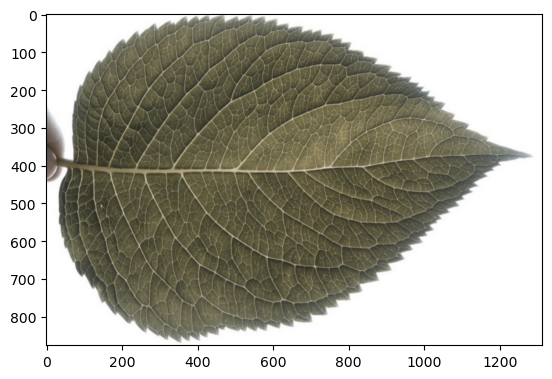

In [6]:
plt.imshow(gaussian_img)

## Edge detection for image processing

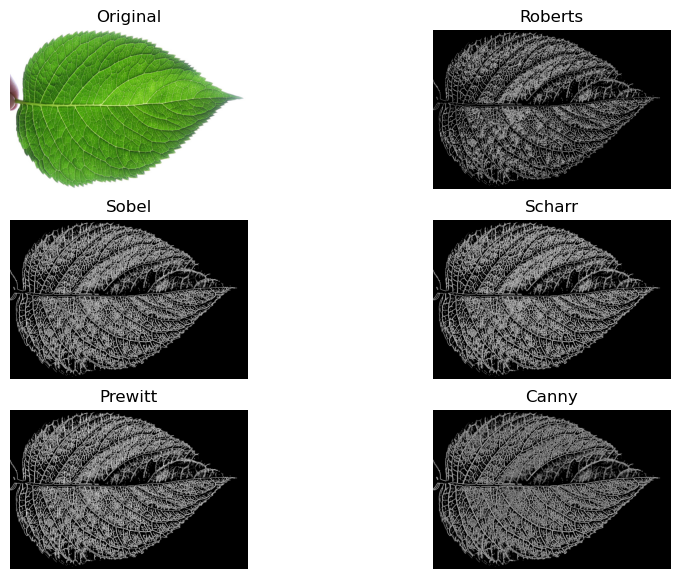

In [32]:
from skimage import io, filters, feature
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
import cv2
import numpy as np
img = rgb2gray(plt.imread('leaf.jpg'))
img = cv2.convertScaleAbs(img)
#Edge detection
from skimage.filters import roberts, sobel, scharr, prewitt, farid
roberts_img = roberts(img)
sobel_img = sobel(img)
scharr_img = scharr(img)
prewitt_img = prewitt(img)
farid_img = farid(img)
canny_edge = cv2.Canny(img, 90, 100)
imglist = [plt.imread('leaf.jpg'), roberts_img, sobel_img, scharr_img, prewitt_img, farid_img, canny_edge]
title = ["Original", "Roberts", "Sobel", "Scharr", "Prewitt", "Canny"]

fig = plt.figure(figsize=(10, 7))
rows = 3
cols = 2
for i in range(rows*cols):
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(imglist[i], cmap='gray')
    plt.axis('off')
    plt.title(title[i])


In [26]:
np.max(img)

1.0

In [ ]:
#cv2.imshow("Farid", farid_img)


#Canny
canny_edge = cv2.Canny(img,50,80)

#Autocanny
sigma = 0.3
median = np.median(img)

# apply automatic Canny edge detection using the computed median
lower = int(max(0, (1.0 - sigma) * median))
upper = int(min(255, (1.0 + sigma) * median))
auto_canny = cv2.Canny(img, lower, upper)


cv2.imshow("Canny", canny_edge)
cv2.imshow("Auto Canny", auto_canny)
cv2.waitKey(0)
cv2.destroyAllWindows()

C:\Users\vinay\AppData\Local\Temp\ipykernel_83376\3347891194.py:11: FutureWarning: Previously, sato implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  sato_img = sato(imggray)
C:\Users\vinay\AppData\Local\Temp\ipykernel_83376\3347891194.py:13: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  hessian_img = hessian(imggray)


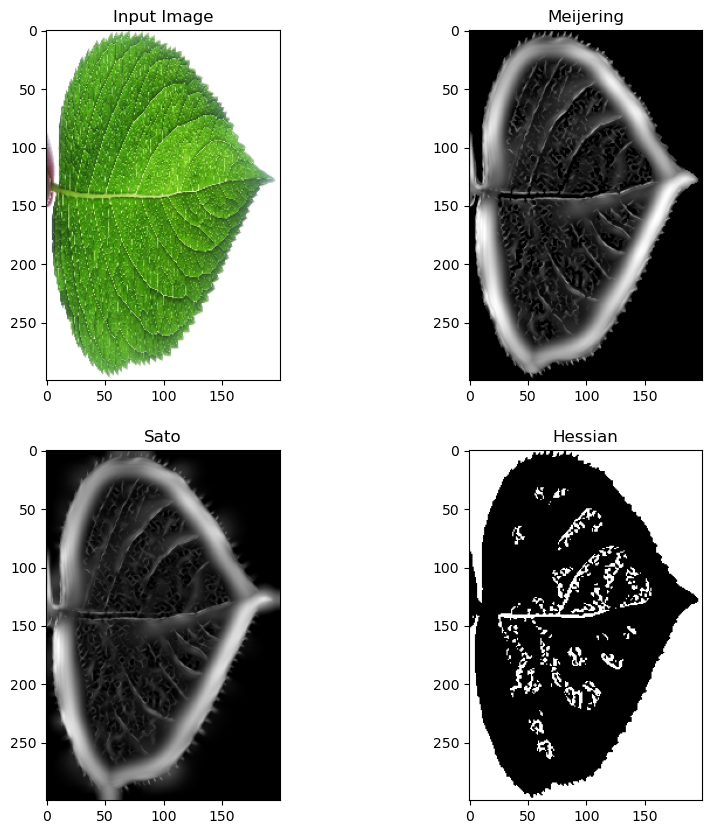

In [4]:

import numpy as np
from skimage.color import rgb2gray # tf.image.rgb_to_grayscale for tensorflow # torchvision.transforms.functional.rgb_to_grayscale; 
import cv2
import matplotlib.pyplot as plt
from skimage.filters import meijering, sato, frangi, hessian # Filters can be used for feature extraction
img = plt.imread("leaf.jpg")
img = cv2.resize(img, [200, 300])
imggray = cv2.normalize(np.double(rgb2gray(img)), None, 0, 1, cv2.NORM_MINMAX)

meijering_img = meijering(imggray)
sato_img = sato(imggray)
frangi_img = frangi(imggray)
hessian_img = hessian(imggray)

fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(meijering_img, cmap='gray')
ax2.title.set_text('Meijering')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(sato_img, cmap='gray')
ax3.title.set_text('Sato')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(hessian_img, cmap='gray')
ax4.title.set_text('Hessian')
plt.show()

# Histogram Equilization ( Fog Removal)

In [82]:
!wget -O fog.jpg https://i0.wp.com/digital-photography-school.com/wp-content/uploads/2018/02/U45A3140-3.jpg

--2023-05-02 09:34:03--  https://i0.wp.com/digital-photography-school.com/wp-content/uploads/2018/02/U45A3140-3.jpg
Resolving i0.wp.com (i0.wp.com)... 192.0.77.2
Connecting to i0.wp.com (i0.wp.com)|192.0.77.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 222484 (217K) [image/jpeg]
Saving to: 'fog.jpg'

     0K .......... .......... .......... .......... .......... 23%  302K 1s
    50K .......... .......... .......... .......... .......... 46%  446K 0s
   100K .......... .......... .......... .......... .......... 69%  658K 0s
   150K .......... .......... .......... .......... .......... 92%  719K 0s
   200K .......... .......                                    100%  696K=0.4s

2023-05-02 09:34:04 (485 KB/s) - 'fog.jpg' saved [222484/222484]



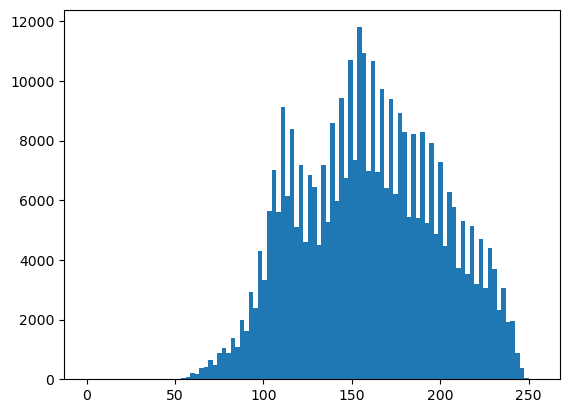

In [97]:
import cv2
import numpy as np
from matplotlib import pyplot as plt 
img = cv2.imread("fog.jpg", 0)
equ = cv2.equalizeHist(img)

plt.hist(img.flat, bins=100, range=(0, 255))
plt.show()



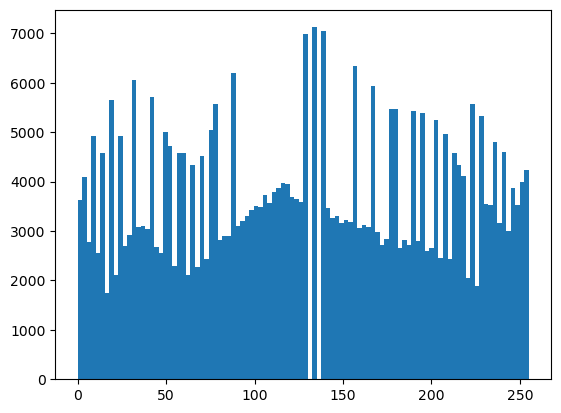

In [98]:
plt.hist(equ.flat, bins=100, range=(0, 255))
plt.show()

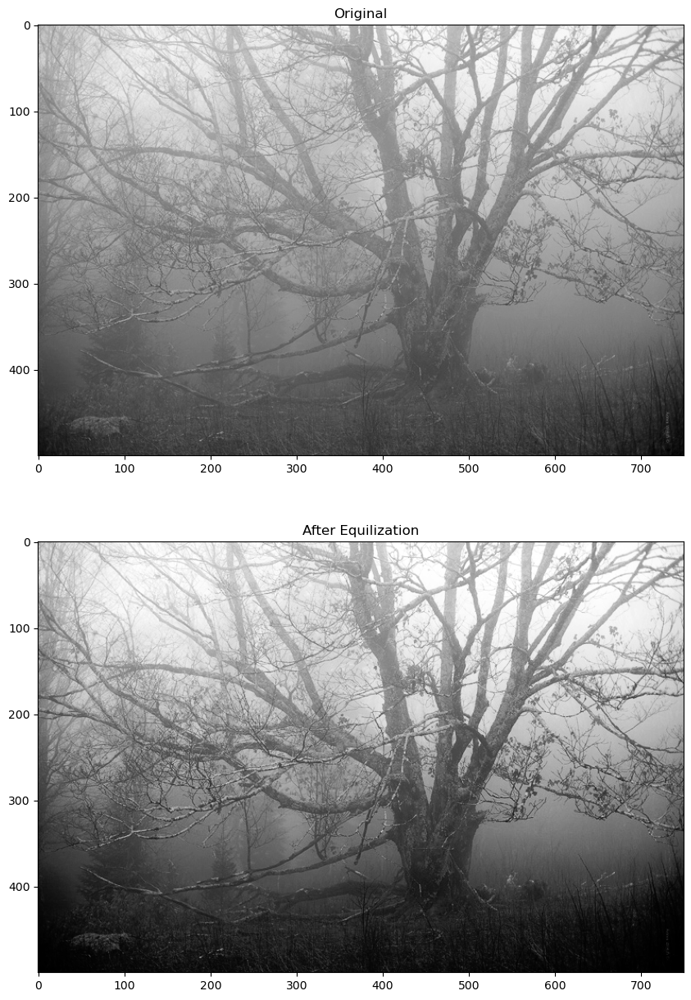

In [94]:
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(2, 1, 1)
plt.imshow(img, cmap='gray')
plt.title("Original")
fig.add_subplot(2, 1, 2)
plt.imshow(equ, cmap='gray')
plt.title("After Equilization")
plt.show()

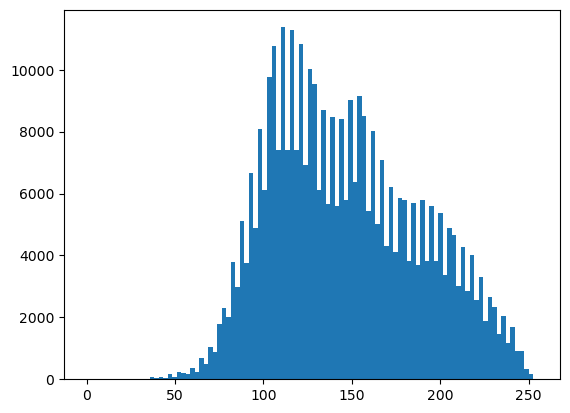

In [99]:
clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
cl_img = clahe.apply(img)
plt.hist(cl_img.flat, bins=100, range=(0, 255))
plt.show()

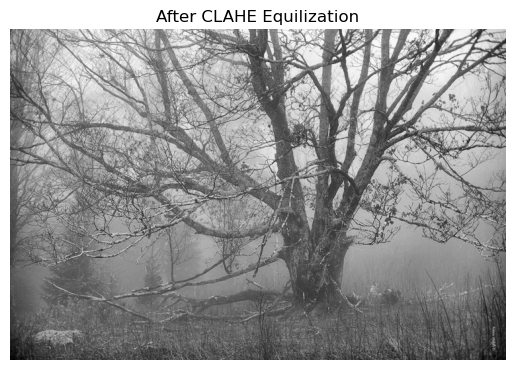

In [100]:

plt.imshow(cl_img, cmap='gray')
plt.title("After CLAHE Equilization")
plt.axis('off')
plt.show()

## Contrast Stretching

In [297]:
!wget -O face.png https://staff.fnwi.uva.nl/r.vandenboomgaard/IPCV20172018/_images/contraststretch.png
!wget -O face2.png https://www.researchgate.net/profile/Christian-Bauckhage/publication/281118372/figure/fig1/AS:614203941478420@1523449039774/Example-of-low-contrast-images-and-corresponding-results-of-intensity-normalization-and.png

--2023-05-03 01:07:12--  https://staff.fnwi.uva.nl/r.vandenboomgaard/IPCV20172018/_images/contraststretch.png
Resolving staff.fnwi.uva.nl (staff.fnwi.uva.nl)... 146.50.61.62
Connecting to staff.fnwi.uva.nl (staff.fnwi.uva.nl)|146.50.61.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126106 (123K) [image/png]
Saving to: 'face.png'

     0K .......... .......... .......... .......... .......... 40%  108K 1s
    50K .......... .......... .......... .......... .......... 81%  323K 0s
   100K .......... .......... ...                             100% 1.32M=0.6s

2023-05-03 01:07:13 (194 KB/s) - 'face.png' saved [126106/126106]

--2023-05-03 01:07:13--  https://www.researchgate.net/profile/Christian-Bauckhage/publication/281118372/figure/fig1/AS:614203941478420@1523449039774/Example-of-low-contrast-images-and-corresponding-results-of-intensity-normalization-and.png
Resolving www.researchgate.net (www.researchgate.net)... 104.17.32.105, 104.17.33.105
Connecting to

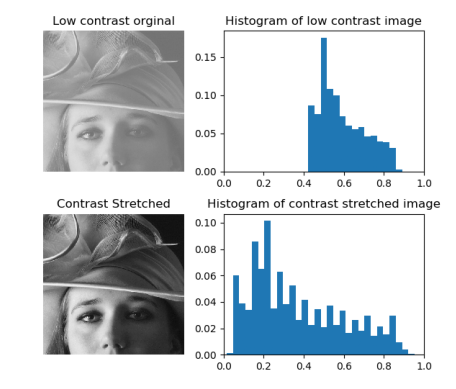

In [296]:
plt.imshow(face)
plt.axis("off")
plt.show()

In [102]:
face2 = plt.imread("face2.png")

(-0.5, 255.5, 255.5, -0.5)

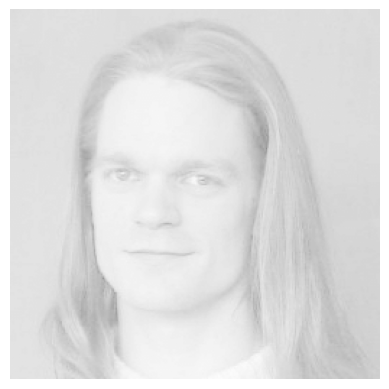

In [108]:

plt.imshow(face2)
plt.axis('off')

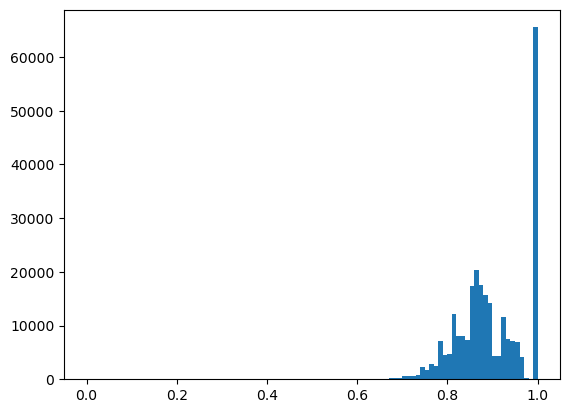

In [354]:
plt.hist(face2.flatten(),range =(0, 1), bins = 100)
plt.show()

In [110]:
face2range = (face2-np.min(face2))/(np.max(face2)-np.min(face2))

(-0.5, 255.5, 255.5, -0.5)

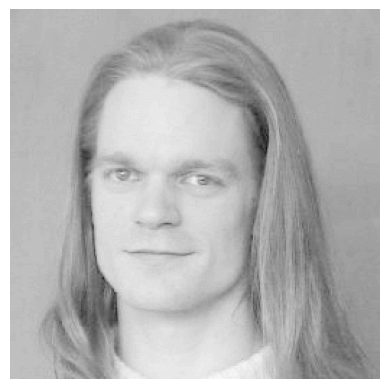

In [111]:
plt.imshow(face2range)
plt.axis('off')

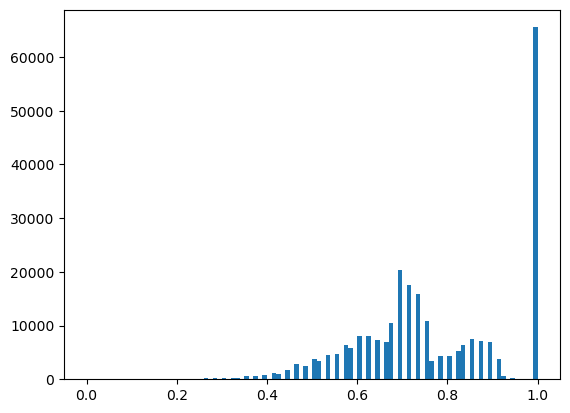

In [330]:
plt.hist(face2range.flatten(),range= (0, 1.0), bins = 100)
plt.show()

In [113]:
import cv2
imghistequ = np.zeros_like(face2range[:, :, 0:3])

In [114]:
imghistequ.shape

(256, 256, 3)

In [115]:
np.max(face2range)

1.0

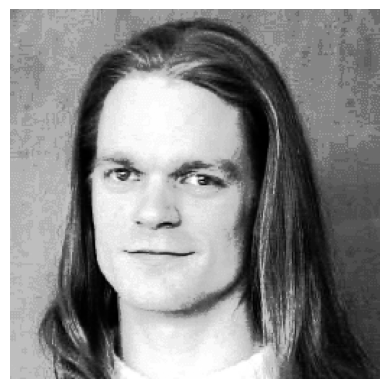

In [117]:

imghistequ[:, :, 0] = cv2.equalizeHist((face2range[:, :, 0]*255).astype('uint8'))
imghistequ[:, :, 1] = cv2.equalizeHist((face2range[:, :, 1]*255).astype('uint8'))
imghistequ[:, :, 2] = cv2.equalizeHist((face2range[:, :, 2]*255).astype('uint8'))

plt.imshow(imghistequ/255)
plt.axis('off')
plt.show()
#(face2range*255).astype('uint8')[:, :, :3].shape

In [409]:
np.max(imghistequ)

255.0

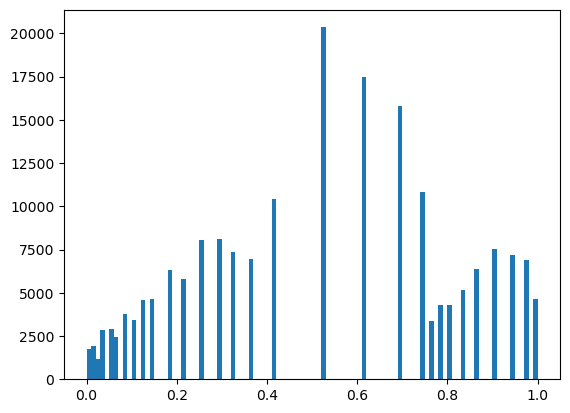

In [417]:
plt.hist((imghistequ/255).flatten(),range= (0,1), bins = 100)
plt.show()

## Segmentation of image

In [425]:
!wget -O sea.jpeg https://miro.medium.com/v2/resize:fit:828/format:webp/1*2Ry_57l1BAKQh0Wgp2kIUg.jpeg

img_name = cv2.imread("sea.jpeg")
img=cv2.cvtColor(img_name,cv2.COLOR_BGR2RGB)

--2023-05-03 02:39:13--  https://miro.medium.com/v2/resize:fit:828/format:webp/1*2Ry_57l1BAKQh0Wgp2kIUg.jpeg
Resolving miro.medium.com (miro.medium.com)... 162.159.153.4, 162.159.152.4
Connecting to miro.medium.com (miro.medium.com)|162.159.153.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41654 (41K) [image/webp]
Saving to: 'sea.jpeg'

     0K .......... .......... .......... ..........           100%  302K=0.1s

2023-05-03 02:39:13 (302 KB/s) - 'sea.jpeg' saved [41654/41654]



In [426]:
vectorized = img.reshape((-1,3))

In [427]:
vectorized.shape

(226188, 3)

In [428]:
vectorized = np.float32(vectorized)

In [431]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

In [432]:
criteria

(3, 10, 1.0)

In [442]:
K = 5
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)

In [443]:
center = np.uint8(center)

In [444]:
res = center[label.flatten()]
result_image = res.reshape((img.shape))

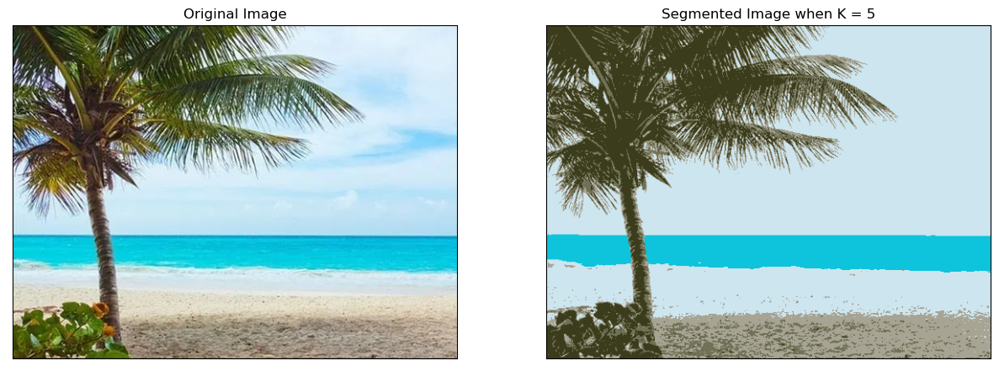

In [445]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

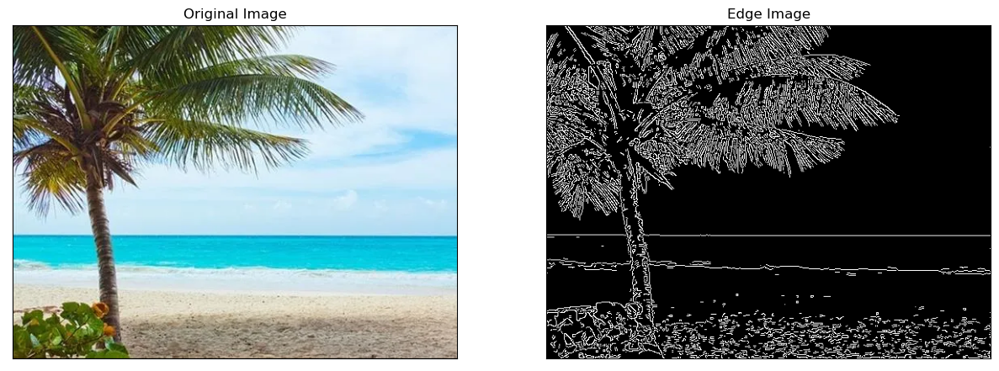

In [437]:
edges = cv2.Canny(img,150,200)
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

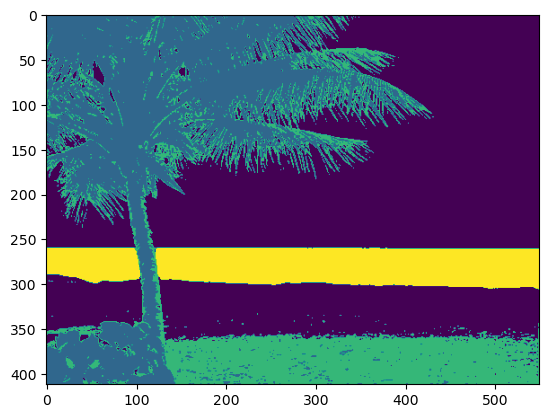

In [456]:
import numpy as np
import cv2


# Convert MxNx3 image into Kx3 where K=MxN
img2 = img.reshape((-1,3))  #-1 rseshape means, in this case MxN

from sklearn.mixture import GaussianMixture as GMM

#covariance choices, full, tied, diag, spherical
gmm_model = GMM(n_components=4, covariance_type='tied').fit(img2)  #tied works better than full
gmm_labels = gmm_model.predict(img2)

#Put numbers back to original shape so we can reconstruct segmented image
original_shape = img.shape
segmented = gmm_labels.reshape(original_shape[0], original_shape[1])
plt.imshow(segmented)

### Matplotlib Subplot creation

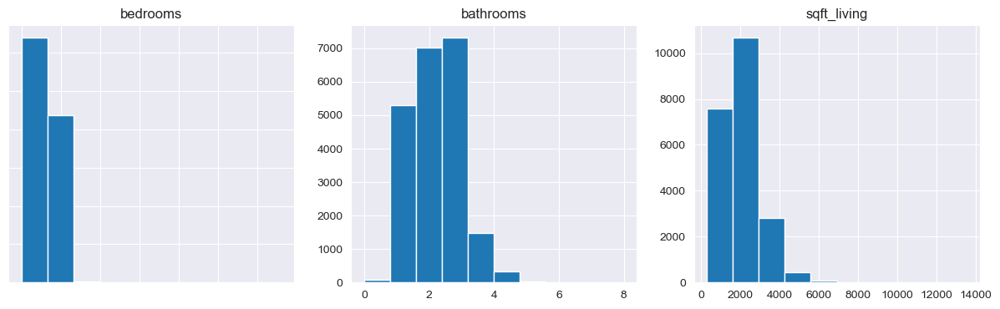

In [13]:
# import pandas, matplotlib and seaborn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# choose style for plots
#sns.set_style("darkgrid")
# import data
df = pd.read_csv('kc_house_data.csv')
# define figure and axes for subplots
fig, ax = plt.subplots(figsize=(15,4), nrows=1, ncols=3);
#plt.tick_params(left = False, right = False , labelleft = False ,
              #  labelbottom = False, bottom = False)
ax[0].hist(df['bedrooms'])
ax[0].set_title('bedrooms')
ax[0].tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
ax[1].hist(df['bathrooms'])
ax[1].set_title('bathrooms')
ax[2].hist(df['sqft_living'])
ax[2].set_title('sqft_living');